The purpose of this notebook is to explore the possibility of improving the dataset upon which we train our color classifier (from RGB values.)

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import pandas as pd

In [5]:
from skimage.color import rgb2hsv

Here is the original labeled color data used to train the model:

In [3]:
data = pd.read_csv('rgb_color_labels.csv')

In [4]:
data.head()

,red,green,blue,label
0,20,139,240,Blue
1,174,83,72,Brown
2,144,249,131,Green
3,168,25,156,Pink
4,30,182,136,Green


The code below uses the Scikit Image 'rgb2hsv' function to convert the (normalized) rgb intensities to hsv.

In [22]:
rgbs = [np.array([r/255, g/255, b/255]) for r, g, b in zip(data.red.tolist(), data.green.to_list(), data.blue.to_list())]

In [23]:
hsvs = [rgb2hsv(rgb) for rgb in rgbs]

In [24]:
data['hsv'] = hsvs

In [25]:
data.head()

,red,green,blue,label,hsv
0,20,139,240,Blue,"[0.5765151515151515, 0.9166666666666667, 0.941..."
1,174,83,72,Brown,"[0.017973856209150332, 0.5862068965517242, 0.6..."
2,144,249,131,Green,"[0.31497175141242933, 0.4738955823293173, 0.97..."
3,168,25,156,Pink,"[0.8473193473193473, 0.8511904761904762, 0.658..."
4,30,182,136,Green,"[0.4495614035087719, 0.8351648351648351, 0.713..."


Separate out the hue (which is given as a percentage, not in degrees) and the saturation and value for each color:

In [27]:
data['hue_percentage'] = data.hsv.map(lambda x: x[0])

In [28]:
data.head()

,red,green,blue,label,hsv,hue_percentage
0,20,139,240,Blue,"[0.5765151515151515, 0.9166666666666667, 0.941...",0.576515
1,174,83,72,Brown,"[0.017973856209150332, 0.5862068965517242, 0.6...",0.017974
2,144,249,131,Green,"[0.31497175141242933, 0.4738955823293173, 0.97...",0.314972
3,168,25,156,Pink,"[0.8473193473193473, 0.8511904761904762, 0.658...",0.847319
4,30,182,136,Green,"[0.4495614035087719, 0.8351648351648351, 0.713...",0.449561


In [38]:
data['saturation'] = data.hsv.map(lambda x: x[1])

In [39]:
data['value'] = data.hsv.map(lambda x: x[2])

Group the data by color labels and explore the mean and standard deviation for hue, saturation and value by color group:

In [40]:
data.groupby('label', as_index=False).mean()

/var/folders/n1/06kwj40j2q1g58ss6ym4_57h0000gn/T/ipykernel_94602/870781640.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  data.groupby('label', as_index=False).mean()


,label,red,green,blue,hue_percentage,saturation,value
0,Black,19.490196,19.372549,25.960784,0.235513,0.219939,0.105882
1,Blue,64.340560,113.681120,195.822042,0.606252,0.710993,0.771150
2,Brown,144.106383,84.183511,58.864362,0.247477,0.643809,0.565123
3,Green,88.367193,186.390528,90.381606,0.335775,0.690553,0.733150
4,Grey,144.155172,149.402299,147.701149,0.447808,0.171253,0.623710
5,Orange,227.819512,130.775610,59.024390,0.082338,0.744442,0.893410
6,Pink,213.404145,75.842832,176.772021,0.876325,0.656684,0.856155
7,Purple,137.077758,60.562387,166.388788,0.790777,0.661792,0.676900
8,Red,205.703390,46.644068,65.669492,0.693121,0.798572,0.806680
9,White,240.586207,236.482759,232.241379,0.084477,0.044509,0.947126


In [42]:
data.groupby('label', as_index=False).std()

,label,red,green,blue,hue_percentage,saturation,value
0,Black,13.685573,12.284886,19.104932,0.322139,0.310842,0.076566
1,Blue,46.431039,68.662990,45.126124,0.072137,0.213191,0.177951
2,Brown,44.900534,47.192212,40.723591,0.359983,0.217178,0.176081
3,Green,55.033722,50.635744,59.920184,0.097456,0.212539,0.196548
4,Grey,48.670938,46.265747,49.406329,0.277067,0.109651,0.184623
5,Orange,19.225739,37.800410,49.475032,0.114630,0.207984,0.075395
6,Pink,28.863760,49.137627,46.208567,0.063433,0.214886,0.109937
7,Purple,38.273228,49.252200,53.835758,0.063400,0.234371,0.192345
8,Red,32.753576,39.662411,38.949953,0.433093,0.172099,0.128445
9,White,12.184643,15.176628,20.267242,0.176939,0.055432,0.041231


In [44]:
data.loc[data.label=='Red'].hue_percentage

29      0.988029
105     0.012266
341     0.028612
402     0.017883
403     0.038462
          ...   
4779    0.947977
4840    0.979003
4858    0.988470
4938    0.989583
4973    0.946792
Name: hue_percentage, Length: 236, dtype: float64

Note that red has a large standard deviation in hue, but this is partly due to the cylindrical nature of the hsv color system -- a red hue can be represented by close to 0% or close to 100% hue.

Black and brown also have fairly large standard deviations in hue. My guess is that hue influences these colors less than saturation and value (which makes sense, because the appearance of black can be achieved by sufficiently reducing value, regardless of saturation and hue, and brown can likely be achieved at many hues, with sufficient reduction in saturation.)

In [47]:
data.loc[data.label=='Black', ['hue_percentage', 'saturation', 'value']]

,hue_percentage,saturation,value
1000,0.616667,0.625000,0.062745
1251,0.675439,0.387755,0.192157
1459,0.693333,0.490196,0.200000
1888,0.755208,0.395062,0.317647
1949,0.986111,0.300000,0.156863
2002,0.347222,0.352941,0.133333
2213,0.307692,0.371429,0.137255
2234,0.571429,0.844828,0.227451
2300,0.622549,0.708333,0.188235
2333,0.608333,0.625000,0.250980


It appears that black can be obtained by making all values sufficiently small, or by making "value" sufficiently small with arbitrary values of hue and saturation. (This aligns with the sense that I got from playing with [this excellent interactive 3D visualization of the hsv color space](https://programmingdesignsystems.com/color/color-models-and-color-spaces/index.html).)

In [52]:
data.loc[(data.label=='Brown')&(data.hue_percentage<0.2), ['hue_percentage', 'saturation', 'value']].describe()

,hue_percentage,saturation,value
count,299.000000,299.000000,299.000000
mean,0.066007,0.641527,0.590098
std,0.038526,0.214360,0.176942
min,0.000000,0.174359,0.086275
25%,0.033333,0.458444,0.472549
50%,0.064972,0.672316,0.623529
75%,0.093689,0.813113,0.723529
max,0.160920,1.000000,0.901961


In [54]:
0.06*360

21.599999999999998

In [55]:
0.03*360

10.799999999999999

In [56]:
0.09*360

32.4

In [57]:
0.95*360

342.0

I randomly chose 0.2 as a cutoff for the percentage of hue. About 300 browns have hue less than 0.2, between 0.03 and 0.1 (these are reds and oranges), and the other 77 have a hue percentage very close to 0.95 (these are reds and pinks.)

Across the board, saturation and value appear to vary between 20 and 80% (for saturation) and 10 and 70% (for value), although value does fall in a slightly stricter range when the hue percentage is high (20 to 55%, versus to 10 to 70%.)

Visually, in the cylindrical representation of hsv color space, having a low 

In [53]:
data.loc[(data.label=='Brown')&(data.hue_percentage>0.2), ['hue_percentage', 'saturation', 'value']].describe()

,hue_percentage,saturation,value
count,77.000000,77.000000,77.000000
mean,0.952148,0.652672,0.468144
std,0.030679,0.229031,0.135045
min,0.853175,0.197674,0.184314
25%,0.929825,0.464052,0.368627
50%,0.957746,0.661765,0.443137
75%,0.975379,0.838095,0.549020
max,0.997942,1.000000,0.835294


<u>New idea</u>

There are 8 or 9 "slices" of color in the hue plane of hsv color.

Evenly sampling across the saturation axis in each hue plane, at a suitably high brightness, should allow us to capture brown and grey colors hidden within the other hues.

Then setting a brightness threshold will allow us to identify black. We also can set brightness to 100% and figure out a threshold for saturation to identify white.

This is the [interactive hsv cylinder](https://programmingdesignsystems.com/color/color-models-and-color-spaces/index.html) (**scroll down**) I was looking at when generating the above idea.

In [33]:
data.loc[data.hue_percentage < 1/6, 'label'].value_counts()

Brown     299
Orange    202
Yellow    167
Red        68
Green      48
Grey       39
Black      32
White      25
Pink        1
Name: label, dtype: int64

In [34]:
data.loc[(data.hue_percentage > 1/6) & (data.hue_percentage < 2/6), 'label'].value_counts()

Green     664
Yellow    115
Grey       23
White       2
Black       2
Name: label, dtype: int64

In [32]:
data.loc[(data.hue_percentage > 2/15) & (data.hue_percentage < 3/15), 'label'].value_counts()

Yellow    176
Green     126
Grey       16
Brown      12
Black       2
Name: label, dtype: int64

In [18]:
rgb2hsv(np.array([100/255, 40/255, 230/255]))

array([0.71929825, 0.82608696, 0.90196078])

Create a list of RGB tuples somewhat "evenly spanning" the RGB color space. That is, every possible tuple of 16 evenly spaced values from 0 to 255 for each color value should be made.

In [54]:
scale = np.linspace(0, 255, 16)

r, g, b = np.meshgrid(scale, scale, scale)

rgb_values = [tuple(rgb_tuple) for rgb_tuple in np.vstack([r.flatten(), g.flatten(), b.flatten()]).T]

In [ ]:
for r in np.linspace(0, 255, 16):
    for g in np.linspace(0, 255, 16):
        for b in np.linspace(0, 255, 16):
            scaled_color = tuple([x/255 for x in (r, g, b)])
            fig, ax = plt.subplots()
            ax = fig.add_subplot(111, aspect='equal')
            ax.xaxis.set_visible(False) # Disable axis x 
            ax.yaxis.set_visible(False) # Disable axis y
            ax.add_patch(patches.Rectangle((0,0), 1, 1, color=scaled_color))
            plt.show(block=False);

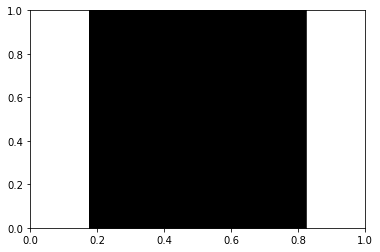

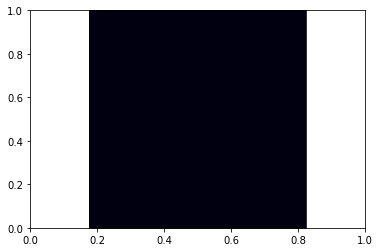

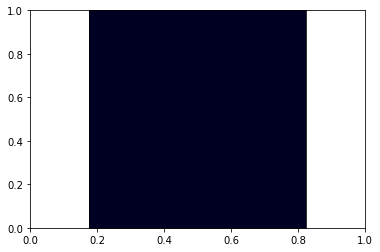

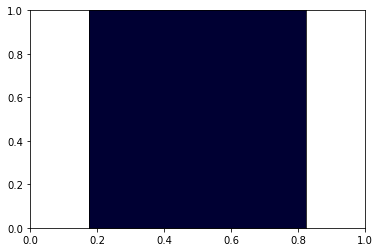

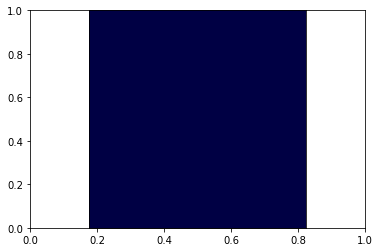

...

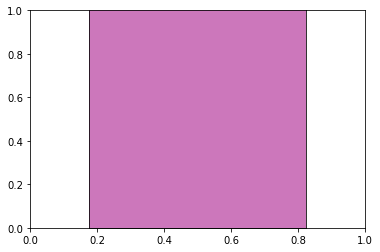

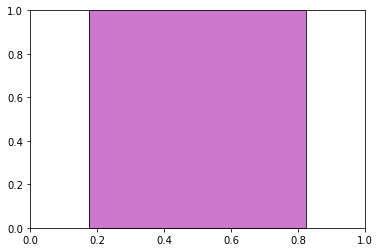

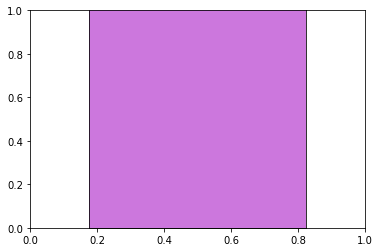

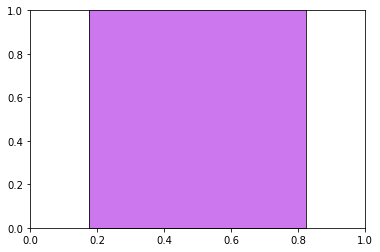

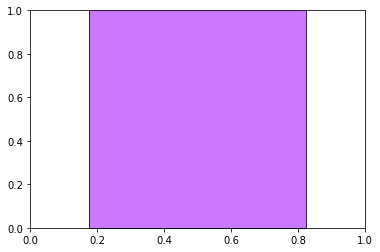

KeyboardInterrupt: 

In [52]:
for rgb_color in rgb_values:
    scaled_color = tuple([x/255 for x in rgb_color])
    fig, ax = plt.subplots()
    ax = fig.add_subplot(111, aspect='equal')
    ax.xaxis.set_visible(False) # Disable axis x 
    ax.yaxis.set_visible(False) # Disable axis y
    ax.add_patch(patches.Rectangle((0,0), 1, 1, color=scaled_color))
    plt.show(block=False);

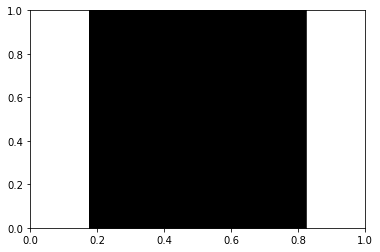

In [74]:
fig, ax = plt.subplots()
ax = fig.add_subplot(111, aspect='equal')
ax.xaxis.set_visible(False) # Disable axis x 
ax.yaxis.set_visible(False) # Disable axis y
ax.add_patch(patches.Rectangle((0,0), 1, 1, color=(0, 0, 0)))
plt.show(block=False);

(r, 0, 0) or (0, g, 0) or (0, 0, b) & r or g or b < 0.15 = black


In [77]:
increments = np.linspace(0, 0.95, 20)
increments

array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 ,
       0.55, 0.6 , 0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95])

In [134]:
fig, ax = plt.subplots()
ax.set_aspect('equal')

for x in increments:
    for y in increments:
        ax.add_patch(patches.Rectangle((x, y), 0.05, 0.05, color=(x, 0, y)))

In [136]:
[(r, g, b) for r, g, b in zip(r_values, g_values, b_values)]

[(0.0, 0, 0.0),
 (0.0, 0, 0.049999999999999996),
 (0.0, 0, 0.09999999999999999),
 (0.0, 0, 0.15),
 (0.0, 0, 0.19999999999999998),
 (0.0, 0, 0.24999999999999997),
 (0.0, 0, 0.3),
 (0.0, 0, 0.35),
 (0.0, 0, 0.39999999999999997),
 (0.0, 0, 0.44999999999999996),
 (0.0, 0, 0.49999999999999994),
 (0.0, 0, 0.5499999999999999),
 (0.0, 0, 0.6),
 (0.0, 0, 0.6499999999999999),
 (0.0, 0, 0.7),
 (0.0, 0, 0.7499999999999999),
 (0.0, 0, 0.7999999999999999),
 (0.0, 0, 0.85),
 (0.0, 0, 0.8999999999999999),
 (0.0, 0, 0.95),
 (0.049999999999999996, 0, 0.0),
 (0.049999999999999996, 0, 0.049999999999999996),
 (0.049999999999999996, 0, 0.09999999999999999),
 (0.049999999999999996, 0, 0.15),
 (0.049999999999999996, 0, 0.19999999999999998),
 (0.049999999999999996, 0, 0.24999999999999997),
 (0.049999999999999996, 0, 0.3),
 (0.049999999999999996, 0, 0.35),
 (0.049999999999999996, 0, 0.39999999999999997),
 (0.049999999999999996, 0, 0.44999999999999996),
 (0.049999999999999996, 0, 0.49999999999999994),
 (0.049999

In [93]:
face_colors = []

for x in increments:
    for y in increments:
        fig, ax = plt.subplots(ncols=2)

        for axis in ax:
            axis.set_aspect('equal')

        ax[0].add_patch(patches.Rectangle((x, y), 0.05, 0.05, color=(x, 0, y)))

        ax[1].add_patch(patches.Rectangle((0, 0), 1, 1, color=(x, 0, y)))
        
        plt.show(block=False);
        
        color_name = input("Enter color name and press enter to continue...")
        face_colors.append(color_name)

Enter color name and press enter to continue...black


Enter color name and press enter to continue...black


Enter color name and press enter to continue...black


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...black


Enter color name and press enter to continue...black


Enter color name and press enter to continue...black


Enter color name and press enter to continue...black


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...black


Enter color name and press enter to continue...black


Enter color name and press enter to continue...black


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...black


Enter color name and press enter to continue...black


Enter color name and press enter to continue...black


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...black


Enter color name and press enter to continue...black


Enter color name and press enter to continue...black


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...brown


Enter color name and press enter to continue...brown


Enter color name and press enter to continue...brown


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...brown


Enter color name and press enter to continue...brown


Enter color name and press enter to continue...brown


Enter color name and press enter to continue...brown


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...brown


Enter color name and press enter to continue...brown


Enter color name and press enter to continue...brown


Enter color name and press enter to continue...red


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...red


Enter color name and press enter to continue...brown


Enter color name and press enter to continue...brown


Enter color name and press enter to continue...red


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...blue


Enter color name and press enter to continue...brown


Enter color name and press enter to continue...brown


Enter color name and press enter to continue...brown


Enter color name and press enter to continue...brown


Enter color name and press enter to continue...red


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...brown


Enter color name and press enter to continue...brown


Enter color name and press enter to continue...brown


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...brown


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...red


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...pink


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


Enter color name and press enter to continue...purple


In [95]:
r_values = []
g_values = []
b_values = []

for x in increments:
    for y in increments:
        r_values.append(x)
        g_values.append(0)
        b_values.append(y)

In [98]:
import pandas as pd

training_data = pd.DataFrame({'red': r_values, 'green': g_values, 'blue': b_values, 'label': face_colors})

In [99]:
training_data.head()

,red,green,blue,label
0,0.0,0,0.00,black
1,0.0,0,0.05,black
2,0.0,0,0.10,black
3,0.0,0,0.15,blue
4,0.0,0,0.20,blue


In [100]:
training_data.label.value_counts()

purple    158
blue       98
red        67
pink       41
brown      20
black      16
Name: label, dtype: int64